# Exploratory Data Analysis

Data obtained from scraping [The Athenaeum](http://www.the-athenaeum.org/).

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns
from PIL import Image
import re

### 1. Raw Data

We collected data for artists and for works (a.k.a. paintings). Their original state is as follows.

In [2]:
authors = pd.read_csv('data/athenaeum_authors.csv')
authors.sample(5)

,first_name,last_name,death_year,bio_url,nationality,art_movement,author_id,bio_info,birth_year
2931,John Evans,Barker,1937.0,http://www.the-athenaeum.org/people/detail.php...,United Kingdom,NaN,7793,NaN,1896
4765,Vasily,Golike,1848.0,http://www.the-athenaeum.org/people/detail.php...,Russian,NaN,9704,NaN,1802
810,Giacomo,Francia,1567.0,http://www.the-athenaeum.org/people/detail.php...,Italian,NaN,4793,NaN,1486
6400,James E.,Freeman,1884.0,http://www.the-athenaeum.org/people/detail.php...,Canadian,NaN,4053,NaN,1808
2462,Daniel Folger,Bigelow,1910.0,http://www.the-athenaeum.org/people/detail.php...,American,NaN,1253,NaN,1823


In [3]:
authors.describe()

,death_year,author_id,birth_year
count,8351.000000,8377.000000,8377.000000
mean,1850.120345,5675.285663,1785.413394
std,129.420641,3314.344907,123.502454
min,19.000000,3.000000,400.000000
25%,1844.000000,2751.000000,1780.000000
50%,1901.000000,5799.000000,1834.000000
75%,1926.000000,8463.000000,1858.000000
max,2013.000000,11724.000000,2669.000000


We can see that every author has a birth year, but not all have a death year (understandably). For that reason, elements in that column show up as `float`. We also find some inconsistent values, such as the minimum death year being smaller than the minimum birth year, or a birth year of 2669.

Given that we're not using those values in our models, and that the paintings themselves have an year assigned to them, we chose to ignore these fields.

In [4]:
authors.describe(include = [object])

,first_name,last_name,bio_url,nationality,art_movement,bio_info
count,8302,8377,8377,8338,1391,555
unique,4557,6621,8377,59,40,519
top,John,Unknown,http://www.the-athenaeum.org/people/detail.php...,American,Dutch Golden Age,External links:
freq,123,43,1,1388,227,22


We find that not all authors have a known first name, and the same goes for the last name if we take into account that 43 of them are simply _Unknown_. Only 6.6% of them have a biography on the website we scraped, and only 16.6% have an assigned art movement.

We can further look into how the _Unknown_ last name does with first names.

In [5]:
authors.loc[authors['last_name'] == 'Unknown', 'first_name'].value_counts()

Flemish School 16th Century      2
Italian School 17th Century      1
French School 19th Century       1
19th century                     1
Spanish School - 14th Century    1
Italian School 13th Century      1
German School 19th Century       1
Spanish School 15th Century      1
Italian School 14th Century      1
Spanish School 17th Century      1
Italian School 16th Century      1
Dutch School 16th Century        1
French School 15th Century       1
Spanish School 19th Century      1
Italian School 18th Century      1
French School - 17th Century     1
French School 14th Century       1
German School 17th Century       1
French School 16th Century       1
German School 15th Century       1
American School 19th Century     1
German School 16th Century       1
British School 17th Century      1
Dutch School 18th Century        1
French School 18th Century       1
Italian School 15th Century      1
American School 18th Century     1
French School 20th Century       1
British School 18th 

As for the works table, the general aspect of it follows. We omit the `image_out`, `height_uom` and `width_uom` because they tell us absolutely no information (they're either `nan` or `'cm'`).

In [6]:
paintings = pd.read_csv('data/athenaeum_paintings.csv').drop(['image_out', 'height_uom', 'width_uom'], axis = 1)
paintings.sample(5)

,medium,painting_location,height,article_type,painting_url,painting_dates,painting_title,author_id,painting_id,width
186196,watercolor,Private collection,25.4,Painting,http://www.the-athenaeum.org/art/display_image...,circa 1911,Arenig,4670,157309,37.5
201403,oil on canvas,Feodosia Picture Gallery (Russian Federation ...,53.0,Painting,http://www.the-athenaeum.org/art/display_image...,1890,"The Black Sea Fleet in the Bay of Theodosia, j...",2159,32099,107.0
55224,oil on canvas,Unknown,NaN,Painting,http://www.the-athenaeum.org/art/display_image...,Date unknown,Mother and child by a fountain,1628,40956,NaN
92003,oil on canvas,Barber Institute of Fine Arts (University of B...,NaN,Painting,http://www.the-athenaeum.org/art/display_image...,circa 1710,Judith and Her Maidservant with the Head of Ho...,6148,205571,NaN
100014,oil on canvas,Colchester and Ipswich Museum (United Kingdom...,124.5,Painting,http://www.the-athenaeum.org/art/display_image...,Date unknown,"Alderman Claude Egerton-Green, JP, Mayor of Co...",8635,189203,99.1


In [7]:
paintings.describe()

,height,author_id,painting_id,width
count,132682.000000,207353.000000,207353.000000,132682.000000
mean,70.298652,3616.637473,131441.079049,73.495612
std,59.157431,3158.509007,79528.109135,77.375487
min,0.800000,3.000000,33.000000,0.940000
25%,35.600000,622.000000,57931.000000,38.300000
50%,57.000000,2749.000000,132743.000000,60.960000
75%,85.000000,5753.000000,198532.000000,91.375000
max,3002.280000,11698.000000,271077.000000,12000.000000


We have records of 207,353 art works. Here, height and width refer to the original height and width of the art pieces in centimeters.

In [8]:
paintings.describe(include = [object])

,medium,painting_location,article_type,painting_url,painting_dates,painting_title
count,175098,206675,207352,207353,207352,207349
unique,36,3594,12,207350,6839,153180
top,oil on canvas,Private collection,Painting,http://www.the-athenaeum.org/art/display_image...,Date unknown,Landscape
freq,123284,74902,173570,2,57696,982


One thing that immediately stands out is the fact that 3 painting urls are repeated.

In [9]:
paintings[paintings['painting_url'].duplicated(keep = False)]

,medium,painting_location,height,article_type,painting_url,painting_dates,painting_title,author_id,painting_id,width
44867,oil on canvas,National Maritime Museum - London (United Kin...,127.0,Painting,http://www.the-athenaeum.org/art/display_image...,circa 1712,Vice-Admiral Sir John Leake,2948,114402,101.6
73713,oil on canvas,"Château de Versailles (France - Versailles, G...",NaN,Painting,http://www.the-athenaeum.org/art/display_image...,1844,Concert in the Gallerie des Guise at Chateau d’Eu,445,87448,NaN
80870,NaN,Musée des Beaux-Arts de Brest (France - Brest),NaN,Unknown,http://www.the-athenaeum.org/art/display_image...,Date unknown,Fish Shop,6783,134110,NaN
162503,oil on canvas,Thorvaldsens Museum - Copenhagen (Denmark - C...,NaN,Painting,http://www.the-athenaeum.org/art/display_image...,1830,Entrance to the Port of Copenhagen with the Ma...,748,91788,NaN
169758,bronze,Musée Rodin - Paris (France - Paris),33.0,Sculpture,http://www.the-athenaeum.org/art/display_image...,1881-1882,Alphonse Legros,220,137162,21.0
203144,NaN,Unknown,NaN,Unknown,http://www.the-athenaeum.org/art/display_image...,Date unknown,The Colonade in Versailles,363,54840,NaN


These conflicts were likely created by the fact that the scraper ran several times and the website database changed, recicling the IDs for some entities. To be clear, not only authors and articles have an ID, but also every image, whose ID generally has no relationship with the former ones.

#### Images

Another important part of our data is the set of images. We scraped the full sized versions, while simultaneously making a resized `200x200` copy. Unfortunately, mostly due to server errors, not all of the works downloaded successfully. The `painting_sizes` table is in essence the same as the `paintings` table, filtered for the artworks that have a downloaded image.

In [10]:
painting_sizes = pd.read_csv('data/athenaeum_paintings_sizes.csv')
painting_sizes[['height_px', 'width_px']].describe()

,height_px,width_px
count,207245.000000,207245.000000
mean,900.058216,934.802794
std,325.118209,335.233085
min,79.000000,103.000000
25%,685.000000,728.000000
50%,848.000000,898.000000
75%,1024.000000,1096.000000
max,4000.000000,3825.000000


Out of 207353 artworks, 108 of them failed to download.

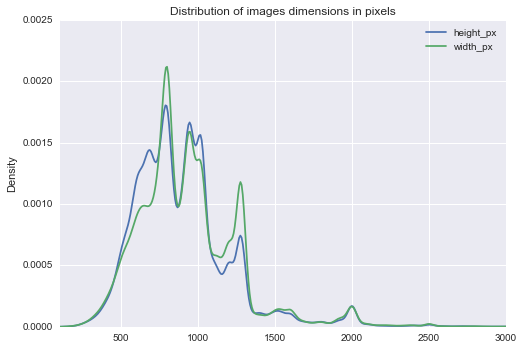

In [11]:
painting_sizes[['height_px', 'width_px']].plot.kde()
plt.xlim(100, 3000)
t = plt.title('Distribution of images dimensions in pixels')

At a first glance, it seems like the majority of the images are horizontal. To verify that claim, we look at their height/width ratio.

In [12]:
hwlogratio = np.log2(painting_sizes['height_px']) - np.log2(painting_sizes['width_px'])
hwlogratio.describe()

count    207245.000000
mean         -0.052724
std           0.517456
min          -3.231816
25%          -0.471621
50%          -0.151286
75%           0.372101
max           3.036526
dtype: float64

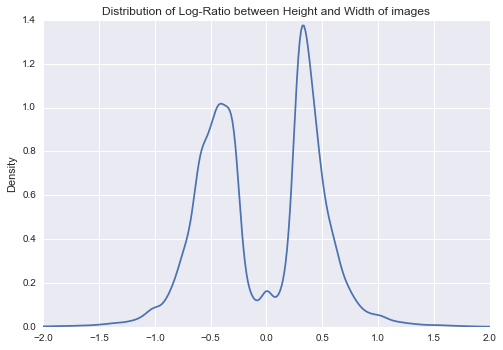

In [13]:
hwlogratio.plot.kde()
plt.title('Distribution of Log-Ratio between Height and Width of images')
t = plt.xlim(-2, 2)

### 2. Data Analysis

Let's now take a look at the types of artworks we have.

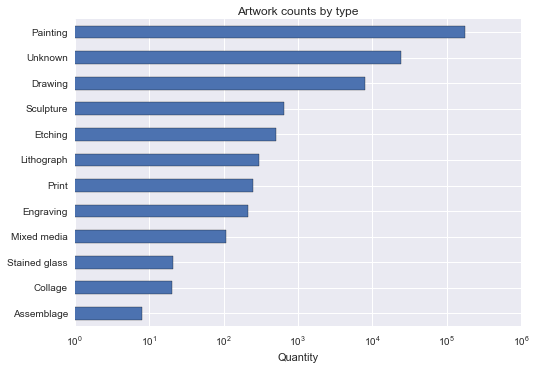

In [14]:
painting_sizes['article_type'].value_counts()[::-1].plot.barh()
plt.title('Artwork counts by type')
plt.xscale('log')
t = plt.xlabel('Quantity')

We can also look for image samples of each type.

In [15]:
def show_images_for_type(article_type):
    sample_painting = paintings[paintings['article_type'] == article_type].sample(8)
    f, ax = plt.subplots(2, 4, figsize = (18,9))
    for i in range(8):
        im = Image.open('data/images_athenaeum/full/%d/%d.jpg' % (sample_painting.iloc[i]['author_id'],
                                                                  sample_painting.iloc[i]['painting_id']))
        curAxis = ax[i / 4, i % 4]
        curAxis.imshow(im)
        curAxis.set_xticks([])
        curAxis.set_yticks([])

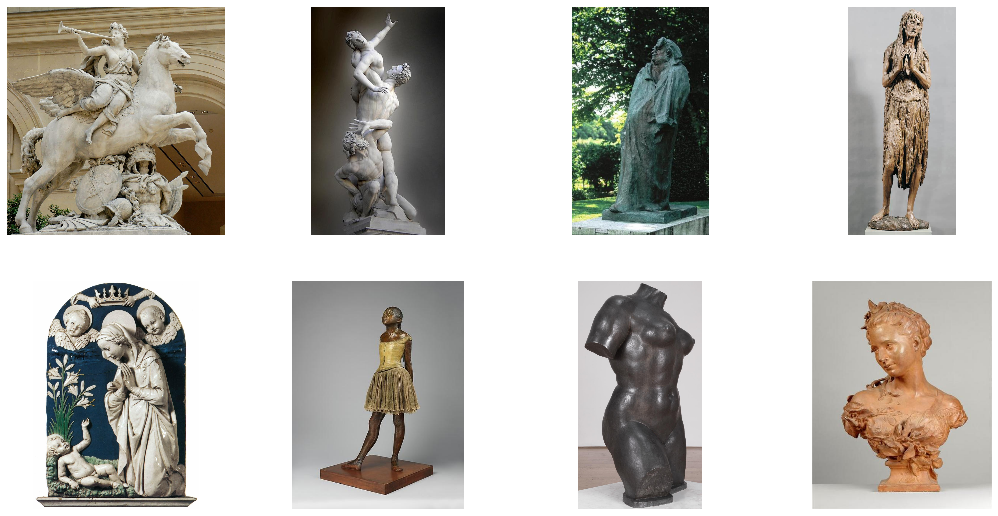

In [16]:
show_images_for_type('Sculpture')

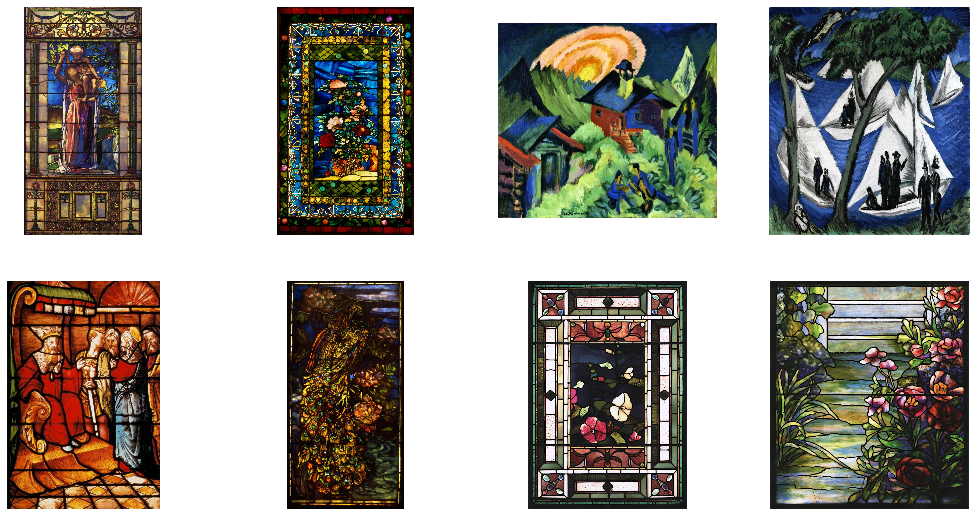

In [17]:
show_images_for_type('Stained glass')

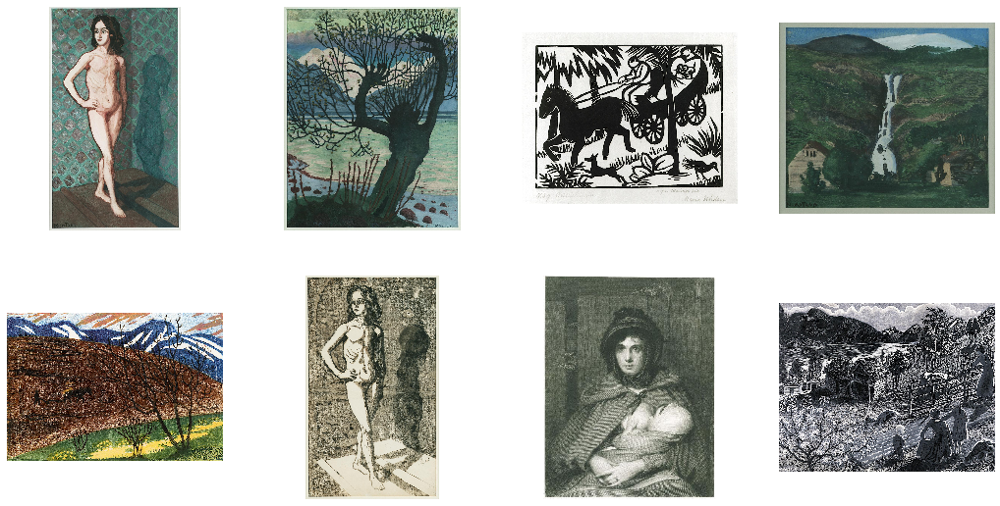

In [18]:
show_images_for_type('Print')

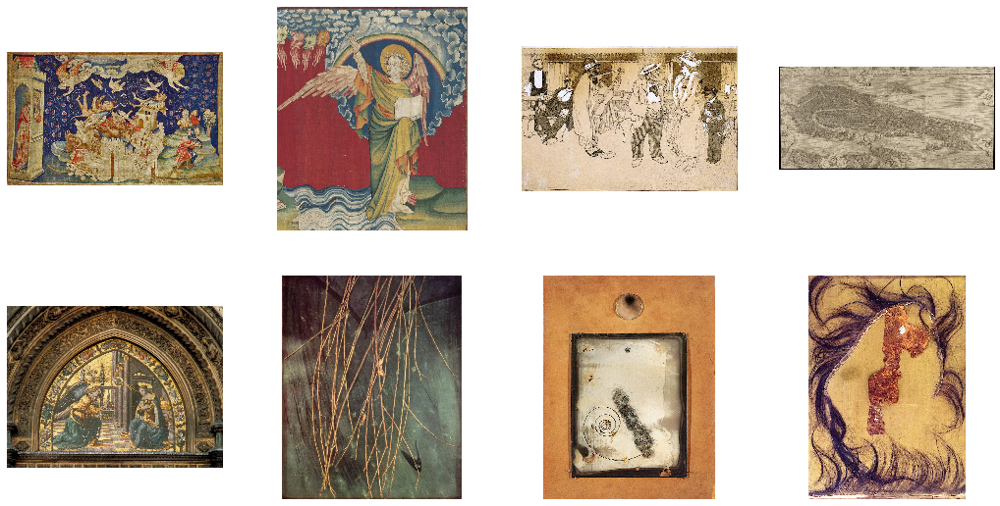

In [19]:
show_images_for_type('Assemblage')

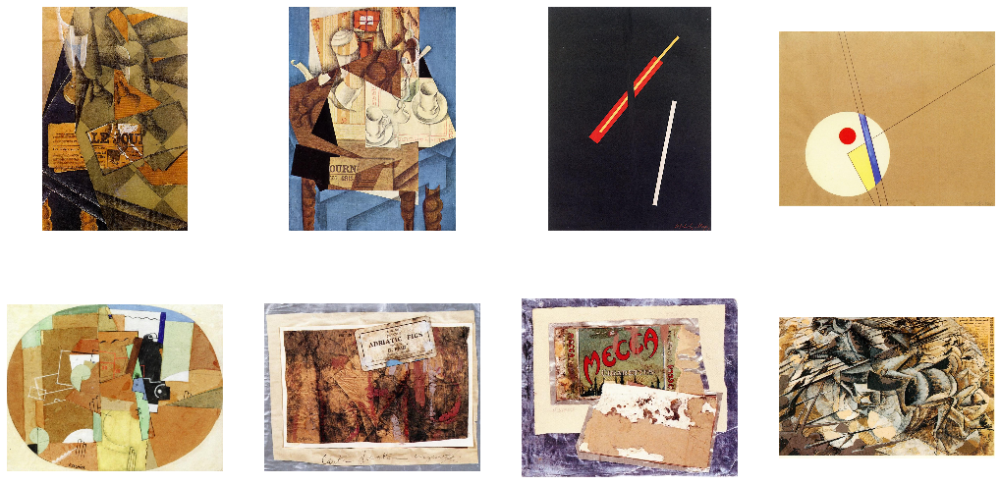

In [20]:
show_images_for_type('Collage')

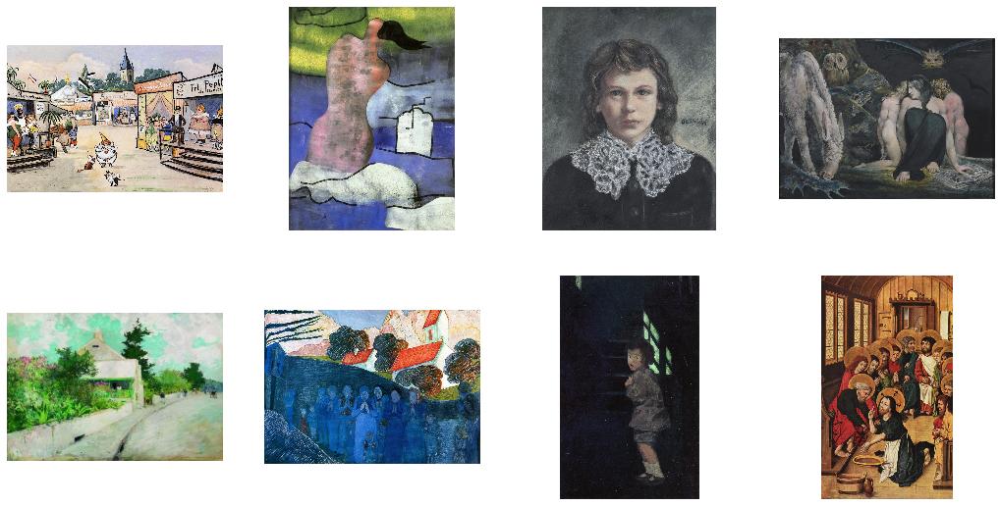

In [21]:
show_images_for_type('Mixed media')

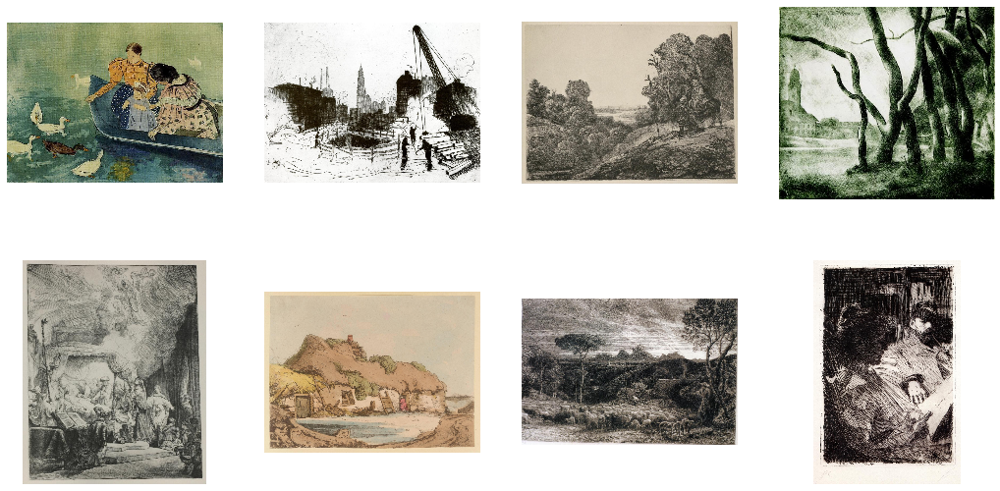

In [22]:
show_images_for_type('Etching')

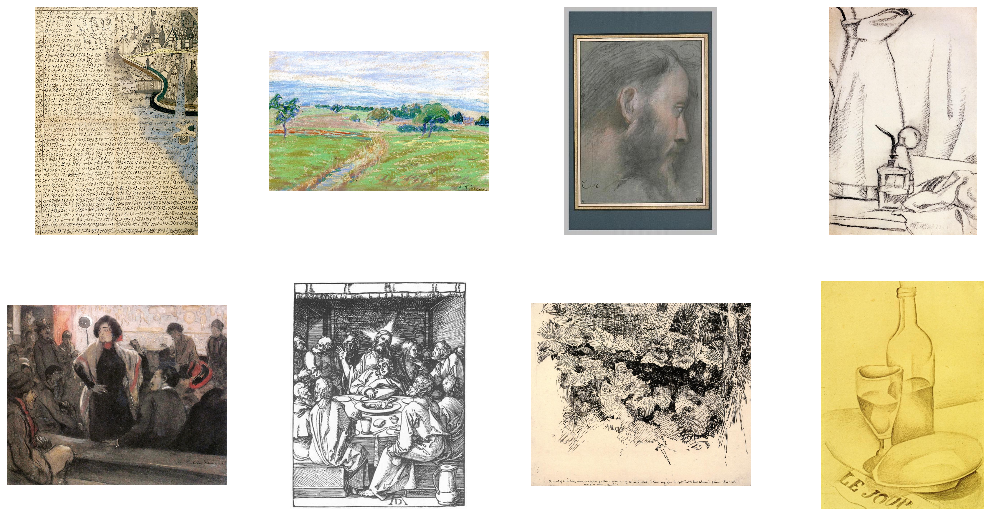

In [23]:
show_images_for_type('Drawing')

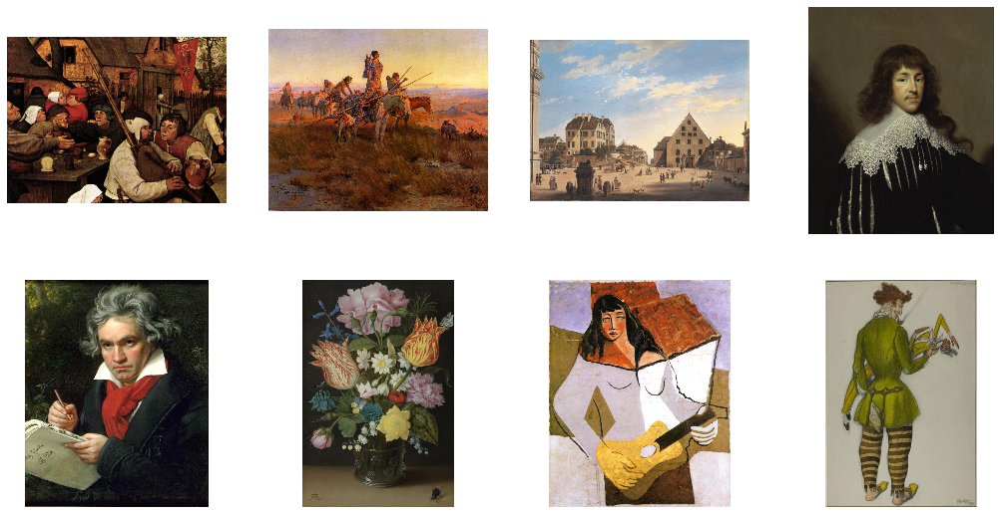

In [24]:
show_images_for_type('Painting')

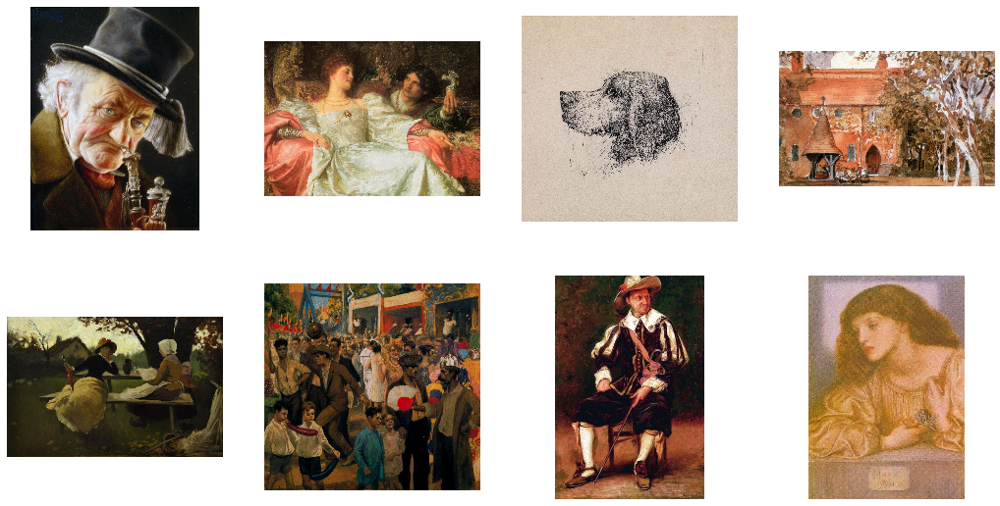

In [25]:
show_images_for_type('Unknown')

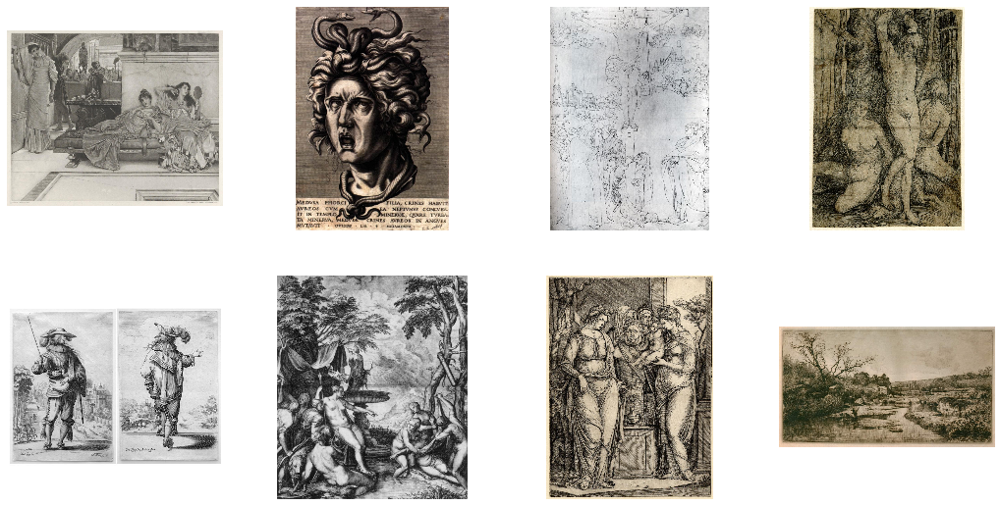

In [26]:
show_images_for_type('Engraving')

We ultimately decided to remove the _Collage_, _Stained glass_ and _Sculpture_ types.

In [27]:
paintings_filtered = painting_sizes.drop(painting_sizes['article_type'].isin(['Collage', 'Stained glass', 'Sculpture']))

### Analysis on Authors

In [28]:
authors = authors.merge(paintings_filtered.groupby('author_id').aggregate({'painting_id': 'count'})\
                        .rename(columns = {'painting_id': 'num_paintings'}).reset_index(), how = 'inner',
                        on = 'author_id')

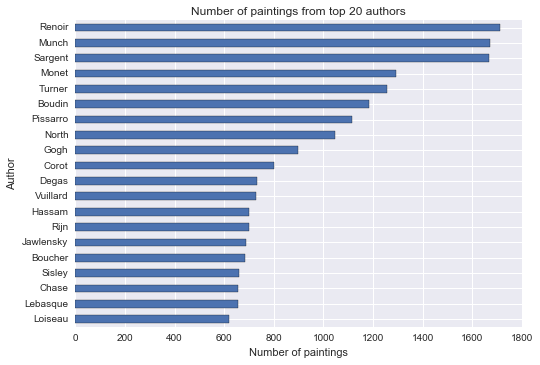

In [29]:
authors.set_index('last_name')['num_paintings'].nlargest(20)[::-1].plot.barh()
plt.xlabel('Number of paintings')
plt.ylabel('Author')
t = plt.title('Number of paintings from top 20 authors')

In [30]:
def text_plot(x, y, s, **kwargs):
    plt.text(x, y, s.iloc[0].decode('ascii', 'ignore'), **kwargs)

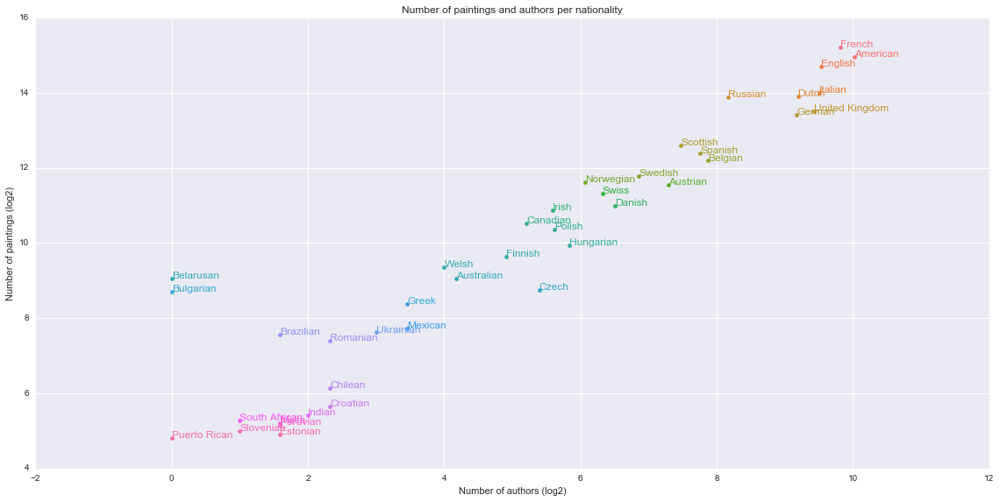

In [31]:
fg = sns.FacetGrid(data=authors.groupby('nationality').aggregate({'author_id': 'count', 'num_paintings': 'sum'})\
            .rename(columns = {'author_id': 'num_authors'}).applymap(np.log2).nlargest(40, 'num_paintings').reset_index(),
                   hue='nationality', size = 8, aspect = 2)
fg = fg.map(plt.scatter, 'num_authors', 'num_paintings')\
        .map(text_plot, 'num_authors', 'num_paintings', 'nationality', fontsize = 12)
plt.title('Number of paintings and authors per nationality')
plt.xlabel('Number of authors (log2)')
t = plt.ylabel('Number of paintings (log2)')

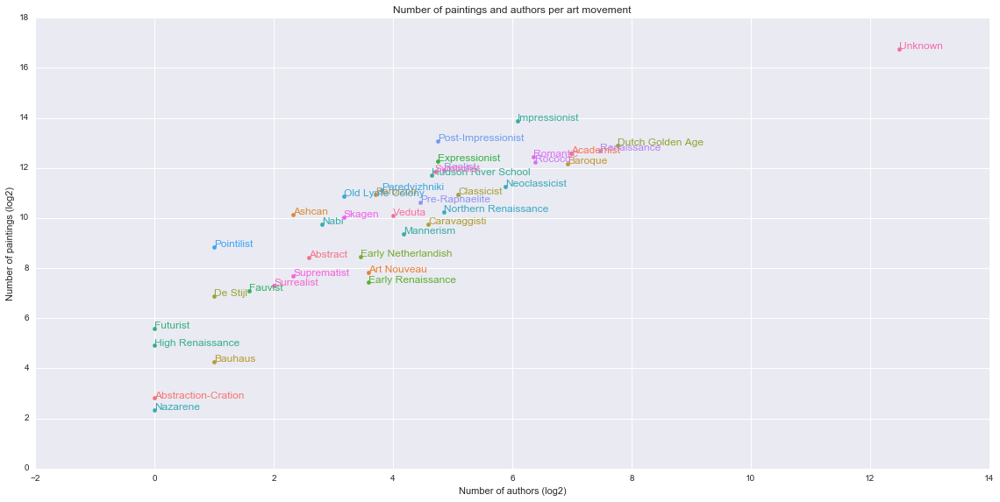

In [32]:
authors['art_movement'] = authors['art_movement']\
    .apply(lambda x: x.decode('ascii', 'ignore') if x is not np.nan else 'Unknown')
fg = sns.FacetGrid(data=authors.groupby('art_movement').aggregate({'author_id': 'count', 'num_paintings': 'sum'})\
            .rename(columns = {'author_id': 'num_authors'}).applymap(np.log2).reset_index(),
                   hue='art_movement', size = 8, aspect = 2)
fg = fg.map(plt.scatter, 'num_authors', 'num_paintings')\
        .map(text_plot, 'num_authors', 'num_paintings', 'art_movement', fontsize = 12)
plt.title('Number of paintings and authors per art movement')
plt.xlabel('Number of authors (log2)')
t = plt.ylabel('Number of paintings (log2)')

On the page on [Art Movements](http://www.the-athenaeum.org/art/movements.php), we find that some of them can be aggregated into larger categories. In order to help us visualize and also to make a predictor's job more attainable, we consider instead the larger categories of art movements.

In [33]:
art_movement_conversor_key = {'Nazarene': 'Romantic',
                             'Abstraction-Cration': 'Abstract', #converted to ASCII
                             'High Renaissance': 'Renaissance',
                             'Futurist': 'Expressionist',
                             'Bauhaus': 'Expressionist',
                             'De Stijl': 'Abstract',
                             'Fauvist': 'Expressionist',
                             'Early Renaissance': 'Renaissance',
                             'Suprematist': 'Abstract',
                             'Pointilist': 'Post-Impressionist',
                             'Mannerism': 'Renaissance',
                             'Caravaggisti': 'Baroque',
                             'Nabi': 'Post-Impressionist',
                             'Skagen': 'Impressionist',
                             'Northern Renaissance': 'Renaissance',
                             'Old Lyme Colony': 'Impressionist',
                             'Barbizon': 'Realist',
                             'Peredvizhniki': 'Realist',
                             'Hudson River School': 'Realist',
                             'Dutch Golden Age': 'Baroque'}
def convert_art_movement(movement):
    return art_movement_conversor_key.get(movement, movement)

In [34]:
authors['sup_art_movement'] = authors['art_movement'].apply(convert_art_movement)

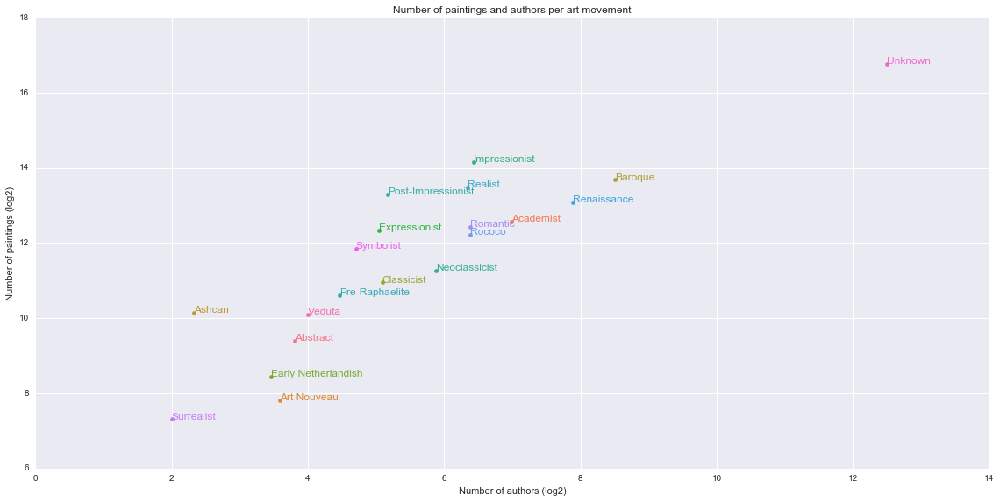

In [35]:
fg = sns.FacetGrid(data=authors.groupby('sup_art_movement').aggregate({'author_id': 'count', 'num_paintings': 'sum'})\
            .rename(columns = {'author_id': 'num_authors'}).applymap(np.log2).reset_index(),
                   hue='sup_art_movement', size = 8, aspect = 2)
fg = fg.map(plt.scatter, 'num_authors', 'num_paintings')\
        .map(text_plot, 'num_authors', 'num_paintings', 'sup_art_movement', fontsize = 12)
plt.title('Number of paintings and authors per art movement')
plt.xlabel('Number of authors (log2)')
t = plt.ylabel('Number of paintings (log2)')

### Analysis on Paintings

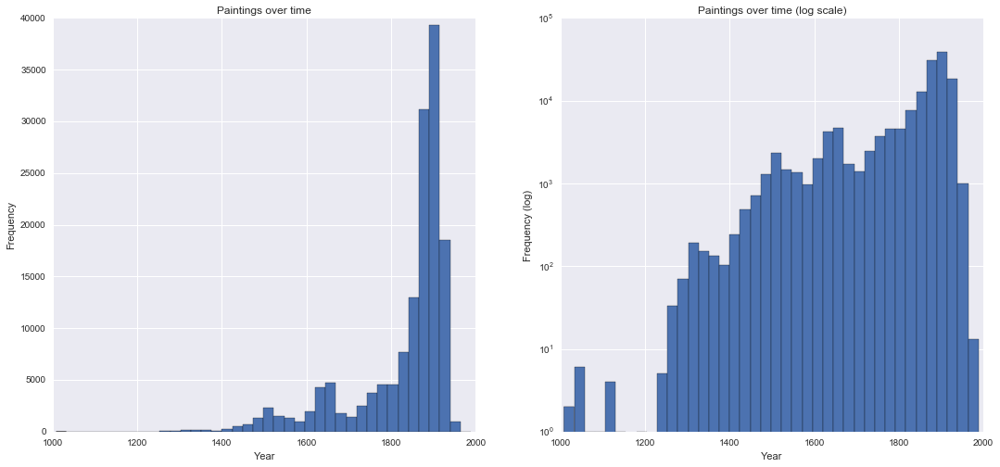

In [36]:
def convert_date(x):
    # removes the 'circa' parts, converts 'date unknown' to None
    x = re.match(r'(?:circa )?(\d+-?\d*)?', str(x)).group(1)
    if x is None:
        return None
    x = map(int, x.split('-'))
    result = sum(x) / len(x)
    return result if result <= 2017 and result >= 1000 else None

to_plot = paintings_filtered['painting_dates'].apply(convert_date)
f, ax = plt.subplots(1, 2, figsize = (18, 8))
plt.subplot(121)
to_plot.plot.hist(bins = 40)
plt.xlabel('Year')
plt.title('Paintings over time')
plt.subplot(122)
to_plot.plot.hist(bins = 40)
plt.yscale('log')
plt.ylabel('Frequency (log)')
plt.xlabel('Year')
t = plt.title('Paintings over time (log scale)')

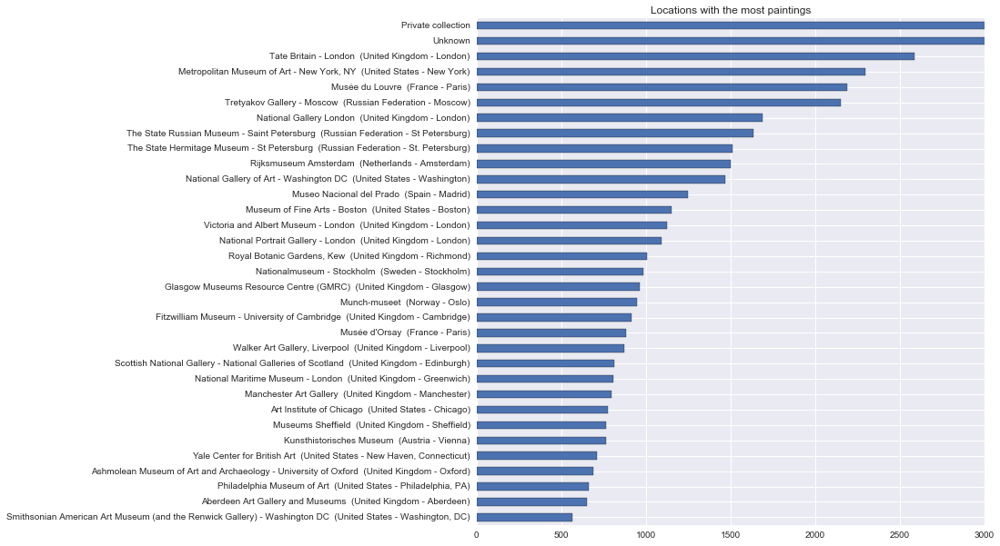

In [37]:
fig = plt.figure(figsize = (10, 10))
paintings_filtered['painting_location'].value_counts()[32::-1].plot.barh()
plt.xlim(0, 3000)
t = plt.title('Locations with the most paintings')

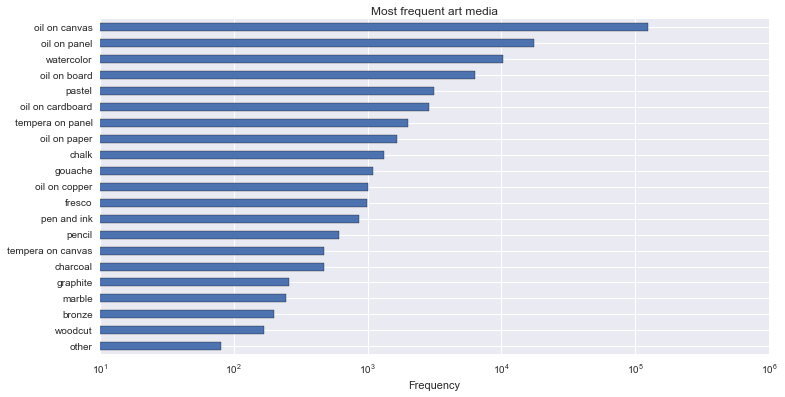

In [38]:
plt.figure(figsize=(12, 6))
paintings_filtered['medium'].value_counts()[20::-1].plot.barh()
plt.xscale('log')
plt.xlabel('Frequency')
t = plt.title('Most frequent art media')